Loading BokehJS ...


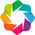

In [1]:
from IPython.display import HTML
from IPython.core.interactiveshell import InteractiveShell # makes all cells allow multiple outputs
from IPython.core.display import HTML, display
from IPython.display import IFrame
InteractiveShell.ast_node_interactivity = "all"
import matplotlib.pyplot as plt

%matplotlib inline

# Import common libraries
import pandas as pd
import numpy as np

import holoviews as hv
import geoviews as gv
import geoviews.feature as gf
import cartopy
import shapely as sh
import datashader as ds

from cartopy import crs as ccrs

from bokeh.tile_providers import STAMEN_TONER
from bokeh.models import WMTSTileSource
from bokeh.plotting import figure, output_file, show

from holoviews.operation.datashader import regrid, shade, datashade, dynspread
from bokeh.tile_providers import STAMEN_TONER

import geoviews.feature as gf

from bokeh.io import output_notebook

output_notebook()
hv.notebook_extension('bokeh')

acc_df = pd.read_pickle('../acc_df.pkl', compression='infer')
acc_df.drop(19230,inplace=True)

HTML('''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
To toggle on/off output_stderr, click <a href="javascript:code_toggle_err()">here</a>.''')

In [2]:
acc_df.head(2)

,DATE_,GROUPE_ACCIDENT,COMMUNE,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,COOR_X,COOR_Y,ETAT_ROUTE,GENRE_ROUTE,...,DayTime,SEASON,CAUSE_g,CAUSE_sg,ENFANTS_IMPLIQUES,NB_MOTO,NB_BIKE,NB_TPubl,NB_ProfT,NB_LourdT
0,2010-11-30,Dérapage ou perte de maîtrise,Genève,Nuit,Chute de neige,Avec blessés légers,6.153116,46.200401,Enneigée,Route secondaire,...,Evening,Autumn,Inattention et distraction,Manque d'attention momentané,0,0.0,0.0,0.0,0.0,0.0
1,2010-12-08,Autres,Genève,Jour,Beau,Autres,6.129641,46.206753,Sèche,Route secondaire,...,Afternoon,Winter,Utilisation inadéquate du véhicule,Stationnement sans précautions suffisantes,0,0.0,0.0,0.0,0.0,0.0


Here we define a function to pass from GPS coordinates to Mercator coordinates, and we process our dataframe in such a way. Furthermore, we define manually the coordinates of the South-East corner and the north-west corner of the map we are interested in (centered on Pont du Mont Blanc and Geneve Train Station) and the function 'window()' resonsible of selecting only the accidents that happened in such region.

In [3]:
from pyproj import Proj, transform
# projection definition
p1 = Proj(init='epsg:4326')
p2 = Proj(init='EPSG:3857')

# Helper functions
def coord_proj(acc_df,i, p1, p2):
    x1 = acc_df['COOR_X'].loc[i]
    y1 = acc_df['COOR_Y'].loc[i]
    x2, y2 = transform(p1,p2,x1,y1)
    acc_df['COOR_X'].set_value(i, x2)
    acc_df['COOR_Y'].set_value(i, y2)

# Project data
for i in range(0, acc_df.shape[0]):
    coord_proj(acc_df,i, p1, p2)

# WINDOW WE'RE INTERESTED IN IN THE CENTER OF GENEVA
SE = [46.203289, 6.154373]
NW = [46.212369, 6.137728]

SE = transform(p1,p2,SE[1],SE[0])
NW = transform(p1,p2,NW[1],NW[0])

def window(df):
    return df[(df['COOR_Y']>SE[1]) &( df['COOR_Y']<NW[1]) & (df['COOR_X']<SE[0]) & (df['COOR_X']>NW[0])]

### SELECT ONLY MEANINGFUL FEATURES FOR THIS ANALYSIS
mini_df = acc_df[['COOR_X', 'COOR_Y', 'CONDITIONS_LUMINEUSES', 'CONDITIONS_METEO',\
                  'GROUPE_ACCIDENT','YEAR','DayTime','CAUSE_g','CAUSE_sg']]
mini_df.tail(2)

,COOR_X,COOR_Y,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,GROUPE_ACCIDENT,YEAR,DayTime,CAUSE_g,CAUSE_sg
19228,687926.770491,5.808768e+06,Jour,Beau,Dérapage ou perte de maîtrise,2014,Morning,Inattention et distraction,Manque d'attention momentané
19229,686340.057934,5.811668e+06,Jour,Beau,Dérapage ou perte de maîtrise,2014,Mid-day,Inattention et distraction,Manque d'attention momentané


## VISUALIZATION OF THE ACCIDENTS IN THE WHOLE CANTON IN ALL THE YEARS 2010-2016

Let's plot a timeseries of the number of accidents happened per year in the canton:

In [4]:
years = list(range(2010,2017))
dictionary = {(year):hv.Points(mini_df[(mini_df.YEAR==year)], ['COOR_X','COOR_Y'])
              for year in years}
hv.Curve((years, [mini_df[mini_df['YEAR']==y].shape[0] for y in years]))

:Curve   [x]   (y)

We see that the number of accident drammatically increased: let's try to plot the accidents of three different years one next to the other, looking for possible patterns in this increase: we use the datashade() library to avoid superimpositions of points that would lead to overplotting, making recognising the true shape of our data impossible.

In [5]:
%%opts Overlay [width=300 height=300 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
dynspread(datashade(dictionary[2010]))*geomap+\
dynspread(datashade(dictionary[2013]))*geomap+\
dynspread(datashade(dictionary[2016]))*geomap

/Users/Mart/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/Users/Mart/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/Users/Mart/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:Layout
   .DynamicMap.I   :DynamicMap   []
   .DynamicMap.II  :DynamicMap   []
   .DynamicMap.III :DynamicMap   []

It is hard through such a visualization get the actual increment of accidents from 2011 to 2016 shown in the previous timeseries: Let's then proceed with a further analysis. Since it is clear that the grat part of the accidents of the canton happened in the city of Geneve only, let's focus our attention there for now:

# A DEEPER ANALYSIS OF THE ACCIDENTS IN GENEVE ONLY

In [6]:
%%output filename="timeseries"
%%opts Curve (x_label='years')
%%opts Overlay [width=600 height=300 show_grid=True ] (background_alpha=1) 

### STORING THE VALUES OF THE FEATURES WE ARE INTERESTED IN 
lums_ = list(mini_df['CONDITIONS_LUMINEUSES'].value_counts().index)+['ALL']
meteos_ = list(mini_df['CONDITIONS_METEO'].value_counts().index)+['ALL']
jours_ = ['Lundi', 'Mardi', 'Mercredi', 'Jeudi','Vendredi', 'Samedi', 'Dimanche','ALL']

### CREATING THE DATAFRAME WITH THE ACCIDENTS IN GENEVE ONLY
Geneve_df = acc_df[acc_df['COMMUNE']=='Genève'][['GROUPE_ACCIDENT', 'CONDITIONS_LUMINEUSES',
       'CONDITIONS_METEO', 'CONSEQUENCES', 'COOR_X', 'COOR_Y', 'JOUR','DayTime','CAUSE_g','CAUSE_sg']]
Geneve_df.reset_index(inplace=True,drop=True)

#####################################################################
### HELPER FUNCTIONS TO RETRIEVE THE DATASET WE ARE INTERESTED IN ###
#####################################################################

def retrieve_Geneve_dataset(lum, jour):
    if (lum != 'ALL') & (jour != 'ALL'):
        return Geneve_df[(Geneve_df['CONDITIONS_LUMINEUSES']==lum) & (Geneve_df['JOUR']==jour)]
    if (lum == 'ALL') & (jour == 'ALL'):
        return Geneve_df
    if (lum == 'ALL'):
         return Geneve_df[Geneve_df['JOUR']==jour]
    if (jour == 'ALL'):
         return Geneve_df[Geneve_df['CONDITIONS_LUMINEUSES']==lum]


def Geneve_timeseries(lum):
    jour_IDS = [1,2,3,4,5,6,7]
    if lum!='ALL':
        return hv.Curve((jour_IDS, [Geneve_df[(Geneve_df['CONDITIONS_LUMINEUSES']==lum) &(Geneve_df['JOUR']==jours_[x-1])].shape[0] for x in jour_IDS],'days'  ))
    return hv.Curve((jour_IDS, [Geneve_df[Geneve_df['JOUR']==jours_[x-1]].shape[0] for x in jour_IDS]))


Geneve_dic = {(lum, jour) : 
              hv.Points( retrieve_Geneve_dataset(lum, jour), ['COOR_X','COOR_Y'], )
              for lum in lums_
              for jour in jours_}

We are interested now incomparing the distribution of accidents between night time and day time in different days of the week: The following plots show the accidents at day-time and at night-time on monday: We see how during night time the number of accidents decreases, while keeping more or less the same shape:

In [7]:
%%opts Overlay [width=500 height=500 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts WMTS (alpha=0.05)

dynspread(datashade(Geneve_dic['Jour','Lundi']))*geomap+\
dynspread(datashade(Geneve_dic['Nuit','Lundi']))*geomap

/Users/Mart/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/Users/Mart/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:Layout
   .DynamicMap.I  :DynamicMap   []
   .DynamicMap.II :DynamicMap   []

Let's try to do the same but with Saturday: we obtain that in this case there's no noticeable decrease of accidents, 

In [8]:
%%output filename="geneve"
%%opts Overlay [width=500 height=500 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts WMTS (alpha=0.05)

dynspread(datashade(Geneve_dic['Jour','Samedi']))*geomap+\
dynspread(datashade(Geneve_dic['Nuit','Samedi']))*geomap

/Users/Mart/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/Users/Mart/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:Layout
   .DynamicMap.I  :DynamicMap   []
   .DynamicMap.II :DynamicMap   []

Now, let's plot _all the accidents in the center of Geneve that happened in the last 7 years_

In [9]:
%%output filename="all_accidents_canton_datashade_small"
%%opts Overlay [width=600 height=600 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts WMTS (alpha=0.05)

from bokeh.tile_providers import STAMEN_TONER
    
geomap = gv.WMTS(STAMEN_TONER)
geomap*dynspread(datashade(hv.Points(Geneve_df,['COOR_X','COOR_Y'])))


/Users/Mart/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

# STATIC VISUALIZATION OF DIFFERENT KIND OF ACCIDENTS IN THE ZONE CLOSE TO THE PONT DU MONT BLANC

In [10]:
#Geneve_df = window(Geneve_df)
main_causes_df = Geneve_df[(Geneve_df['GROUPE_ACCIDENT']=='Dérapage ou perte de maîtrise')\
          | (Geneve_df['GROUPE_ACCIDENT']=='Accident par tamponnement')| \
                           (Geneve_df['GROUPE_ACCIDENT']=='Accident impliquant des piétons')|\
                          (Geneve_df['GROUPE_ACCIDENT']=='Accident en parquant')]

main_causes_df.tail()

,GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,COOR_X,COOR_Y,JOUR,DayTime,CAUSE_g,CAUSE_sg
8904,Accident par tamponnement,Nuit,Beau,Autres,685501.898759,5.813364e+06,Mercredi,Night,Etat / intention du conducteur,Influence de l'alcool
8905,Dérapage ou perte de maîtrise,Jour,Couvert,Avec blessés légers,685980.079668,5.813586e+06,Vendredi,Morning,Vitesse,Inadaptée aux conditions de visibilité (réduit...
8906,Accident en parquant,Jour,Beau,Autres,684498.364148,5.814129e+06,Samedi,Morning,Cause inconnue,Véhicule stationné (omission de la déclaration...
8909,Accident en parquant,Jour,Autre,Autres,682073.461124,5.813776e+06,Lundi,Mid-day,Cause inconnue,Véhicule stationné (omission de la déclaration...
8912,Dérapage ou perte de maîtrise,Jour,Beau,Avec blessés graves,686340.057934,5.811668e+06,Samedi,Mid-day,Inattention et distraction,Manque d'attention momentané


In [11]:
%%output filename="all_causes"
%%opts Overlay [width=700 height=700 xaxis=None yaxis=None show_grid=False apply_ranges=True legend=False ] (background_alpha=0.1 legend=False) 
%%opts Shape (fill_color=None line_width=1.5 legend=False) [apply_ranges=False legend=False] 
%%opts Points [tools=[ "hover", "box_zoom","save"] color_index=2 scaling_factor=2 legend=False] (cmap="Spectral" legend=False)
%%opts WMTS (alpha=0.05 legend=False)


geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( Geneve_df, ['COOR_X','COOR_Y'])


Unexpected plot option 'legend' for Overlay in loaded backends 'matplotlib' and 'bokeh'.

Similar keywords in the currently active 'bokeh' renderer are: ['show_legend', 'legend_cols', 'legend_limit']

If you believe this keyword is correct, please make sure the backend has been imported or loaded with the hv.extension.

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,DayTime,CAUSE_g,CAUSE_sg)

In [18]:
%%output filename="main_causes_size5"
%%opts Overlay [width=4000 height=4000 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "save","hover", "box_zoom"] color_index=2]
%%opts Points (cmap="Spectral"  size=1)
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( main_causes_df, ['COOR_X','COOR_Y'] )

#renderer = hv.Store.renderes['matplotlib'].instance(fig)'svg',holomap='gif')
#renderer.save(plot,'plot')

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,DayTime,CAUSE_g,CAUSE_sg)

holoviews.core.overlay.Overlay

No valid tile source URL found in WMTS Element, rendering skipped.

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,DayTime,CAUSE_g,CAUSE_sg)

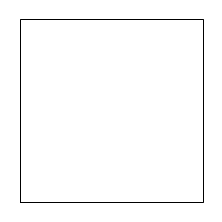

In [29]:
%%output filename="day_and_night" 
%%opts Overlay [width=800 height=500 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "hover", "box_zoom"] color_index=3 scaling_factor=2]
%%opts Points (cmap="Spectral")
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( Geneve_df, ['COOR_X','COOR_Y'] )

In [20]:
Geneve_df['maitrise']=list(Geneve_df['GROUPE_ACCIDENT']=='Dérapage ou perte de maîtrise')
Geneve_df['pieton']=list(Geneve_df['GROUPE_ACCIDENT']=='Accident impliquant des piétons')
Geneve_df['pluie']=list(Geneve_df['CONDITIONS_METEO']=='Pluie')

In [21]:
%%output filename="pietons"
%%opts Overlay [width=800 height=500 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "hover", "box_zoom"] color_index=11 scaling_factor=2]
%%opts Points (cmap='cool')
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( Geneve_df, ['COOR_X','COOR_Y'] )

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,DayTime,CAUSE_g,CAUSE_sg,maitrise,pieton,pluie)

In [22]:
%%output filename="PLUIE"
%%opts Overlay [width=800 height=500 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "hover", "box_zoom"] color_index=12 scaling_factor=2]
%%opts Points (cmap='cool' size=3)
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( Geneve_df, ['COOR_X','COOR_Y'] )

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,DayTime,CAUSE_g,CAUSE_sg,maitrise,pieton,pluie)